In [14]:
# Import tất cả thư viện cần thiết
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import builtins

# PySpark imports
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, sum, when, max, min, stddev, variance, percentile_approx, count

# PySpark ML imports
from pyspark.ml.feature import VectorAssembler, StandardScaler
from pyspark.ml.regression import LinearRegression as SparkLinearRegression
from pyspark.ml import Pipeline
from pyspark.ml.evaluation import RegressionEvaluator

# Scikit-learn imports
from sklearn.linear_model import LinearRegression as SklearnLinearRegression

# Scipy imports
from scipy import stats

In [15]:
# Khởi tạo SparkSession
spark = SparkSession.builder.appName("Diabetes").getOrCreate()

df = spark.read.csv(
    "diabetes_dataset.csv",
    header=True,
    inferSchema=True
)

# Tạo temporary view để dùng SQL
df.createOrReplaceTempView("diabetes")

# Hiển thị thông tin cơ bản về dataset
print("=== Thông tin Dataset ===")
row_count = spark.sql("SELECT COUNT(*) as count FROM diabetes").collect()[0][0]
col_count = len(df.columns)
print(f"Số dòng: {row_count}")
print(f"Số cột: {col_count}")

# Hiển thị schema (cấu trúc dữ liệu)
print("\n=== Schema ===")
df.printSchema()

# Hiển thị 5 dòng đầu tiên bằng SQL
print("\n=== Dữ liệu mẫu ===")
spark.sql("SELECT * FROM diabetes LIMIT 5").show()

=== Thông tin Dataset ===
Số dòng: 100000
Số cột: 31

=== Schema ===
root
 |-- age: integer (nullable = true)
 |-- gender: string (nullable = true)
 |-- ethnicity: string (nullable = true)
 |-- education_level: string (nullable = true)
 |-- income_level: string (nullable = true)
 |-- employment_status: string (nullable = true)
 |-- smoking_status: string (nullable = true)
 |-- alcohol_consumption_per_week: integer (nullable = true)
 |-- physical_activity_minutes_per_week: integer (nullable = true)
 |-- diet_score: double (nullable = true)
 |-- sleep_hours_per_day: double (nullable = true)
 |-- screen_time_hours_per_day: double (nullable = true)
 |-- family_history_diabetes: integer (nullable = true)
 |-- hypertension_history: integer (nullable = true)
 |-- cardiovascular_history: integer (nullable = true)
 |-- bmi: double (nullable = true)
 |-- waist_to_hip_ratio: double (nullable = true)
 |-- systolic_bp: integer (nullable = true)
 |-- diastolic_bp: integer (nullable = true)
 |-- hear

In [16]:
# Check null
df.select([
    sum(col(c).isNull().cast("int")).alias(c)
    for c in df.columns
]).show()

+---+------+---------+---------------+------------+-----------------+--------------+----------------------------+----------------------------------+----------+-------------------+-------------------------+-----------------------+--------------------+----------------------+---+------------------+-----------+------------+----------+-----------------+---------------+---------------+-------------+---------------+--------------------+-------------+-----+-------------------+--------------+------------------+
|age|gender|ethnicity|education_level|income_level|employment_status|smoking_status|alcohol_consumption_per_week|physical_activity_minutes_per_week|diet_score|sleep_hours_per_day|screen_time_hours_per_day|family_history_diabetes|hypertension_history|cardiovascular_history|bmi|waist_to_hip_ratio|systolic_bp|diastolic_bp|heart_rate|cholesterol_total|hdl_cholesterol|ldl_cholesterol|triglycerides|glucose_fasting|glucose_postprandial|insulin_level|hba1c|diabetes_risk_score|diabetes_stage|diag

In [17]:
# Check duplicates
# This cell computes total rows, distinct rows (all columns), and shows sample duplicate groups
total = df.count()
distinct_all = df.dropDuplicates().count()
duplicates_all = total - distinct_all
print(f"Total rows: {total}")
print(f"Distinct rows: {distinct_all}")
print(f"Duplicate rows: {duplicates_all}")
if duplicates_all > 0:
    # Loại bỏ các dòng trùng lặp
    df = df.dropDuplicates()
    print(f"\n=== Sau khi loại bỏ trùng lặp ===")
    print(f"Số dòng còn lại: {df.count()}")
else:
    print("No duplicates found.")

Total rows: 100000
Distinct rows: 100000
Duplicate rows: 0
No duplicates found.


In [18]:
# Xử lý dữ liệu ngoại lai (Outliers) 
print("=== PHÁT HIỆN DỮ LIỆU NGOẠI LAI ===")

numeric_cols = [field.name for field in df.schema.fields 
                if str(field.dataType) in ["IntegerType()", "DoubleType()", "FloatType()", "LongType()"]]

print(f"Các cột số cần kiểm tra outliers: {numeric_cols}")
print(f"Số dòng ban đầu: {df.count()}")

# Phương pháp IQR (Interquartile Range)
total_outliers = 0

for col_name in numeric_cols:
    # Tính Q1, Q3
    quantiles = df.approxQuantile(col_name, [0.25, 0.75], 0.05)
    Q1 = quantiles[0]
    Q3 = quantiles[1]
    IQR = Q3 - Q1
    
    # Tính ngưỡng outlier
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Đếm số outliers
    outliers_count = df.filter((col(col_name) < lower_bound) | (col(col_name) > upper_bound)).count()
    
    print(f"\n{col_name}:")
    print(f"  Q1={Q1:.2f}, Q3={Q3:.2f}, IQR={IQR:.2f}")
    print(f"  Ngưỡng: [{lower_bound:.2f}, {upper_bound:.2f}]")
    print(f"  Số outliers: {outliers_count}")
    
    total_outliers += outliers_count

print(f"\n=== KẾT QUẢ PHÁT HIỆN OUTLIERS ===")
print(f"Tổng số outliers phát hiện: {total_outliers}")
print(f"Số dòng trong dataset: {df.count()}")

=== PHÁT HIỆN DỮ LIỆU NGOẠI LAI ===
Các cột số cần kiểm tra outliers: ['age', 'alcohol_consumption_per_week', 'physical_activity_minutes_per_week', 'diet_score', 'sleep_hours_per_day', 'screen_time_hours_per_day', 'family_history_diabetes', 'hypertension_history', 'cardiovascular_history', 'bmi', 'waist_to_hip_ratio', 'systolic_bp', 'diastolic_bp', 'heart_rate', 'cholesterol_total', 'hdl_cholesterol', 'ldl_cholesterol', 'triglycerides', 'glucose_fasting', 'glucose_postprandial', 'insulin_level', 'hba1c', 'diabetes_risk_score', 'diagnosed_diabetes']
Số dòng ban đầu: 100000

age:
  Q1=40.00, Q3=59.00, IQR=19.00
  Ngưỡng: [11.50, 87.50]
  Số outliers: 947

alcohol_consumption_per_week:
  Q1=1.00, Q3=3.00, IQR=2.00
  Ngưỡng: [-2.00, 6.00]
  Số outliers: 458

physical_activity_minutes_per_week:
  Q1=58.00, Q3=149.00, IQR=91.00
  Ngưỡng: [-78.50, 285.50]
  Số outliers: 4861

diet_score:
  Q1=4.80, Q3=7.00, IQR=2.20
  Ngưỡng: [1.50, 10.30]
  Số outliers: 529

sleep_hours_per_day:
  Q1=6.30, Q

In [19]:
#Drop unnecessary columns
cols_to_drop = [
    "ethnicity",
    "gender",
    "education_level",
    "family_history_diabetes",
    "smoking_status",
    "alcohol_consumption_per_week",
    "sleep_hours_per_day",
    "screen_time_hours_per_day",
    "hypertension_history",
    "cardiovascular_history",
    "waist_to_hip_ratio",
    "diastolic_bp",
    "heart_rate",
    "cholesterol_total",
    "glucose_postprandial",
    "insulin_level",
    "income_level",
    "employment_status",
    "diabetes_stage",
    "diagnosed_diabetes"
]

df = df.drop(*cols_to_drop)

In [20]:
df.show()

+---+----------------------------------+----------+----+-----------+---------------+---------------+-------------+---------------+-----+-------------------+
|age|physical_activity_minutes_per_week|diet_score| bmi|systolic_bp|hdl_cholesterol|ldl_cholesterol|triglycerides|glucose_fasting|hba1c|diabetes_risk_score|
+---+----------------------------------+----------+----+-----------+---------------+---------------+-------------+---------------+-----+-------------------+
| 58|                               215|       5.7|30.5|        134|             41|            160|          145|            136| 8.18|               29.6|
| 48|                               143|       6.7|23.1|        129|             55|             50|           30|             93| 5.63|               23.0|
| 60|                                57|       6.4|22.2|        115|             66|             99|           36|            118| 7.51|               44.7|
| 74|                                49|       3.4|26.8|  

In [23]:
# Export cleaned DataFrame as single CSV file
import os, glob, shutil
out_dir = "output/cleaned_data_tmp"
# Coalesce to a single partition and write out
df.coalesce(1).write.csv(out_dir, header=True, mode="overwrite")
# Find the single part file Spark produced and move it
part_files = glob.glob(os.path.join(out_dir, "part-*.csv"))
if part_files:
    part_file = part_files[0]
    dest = "output/cleaned_data.csv"
    shutil.move(part_file, dest)
    # cleanup temporary folder contents except the moved file
    for f in glob.glob(os.path.join(out_dir, "*")):
        # skip if it's the moved file (already relocated)
        if os.path.abspath(f) == os.path.abspath(dest):
            continue
        if os.path.isdir(f):
            shutil.rmtree(f, ignore_errors=True)
        else:
            try:
                os.remove(f)
            except OSError:
                pass
    try:
        os.rmdir(out_dir)
    except OSError:
        pass
    print("Written:", dest)
else:
    print("No part file found in", out_dir)

Written: output/cleaned_data.csv


=== VẼ ĐƯỜNG HỒI QUY CHO CÁC CỘT SỐ VỚI DIABETES_RISK_SCORE ===
Các cột số: ['age', 'physical_activity_minutes_per_week', 'diet_score', 'bmi', 'systolic_bp', 'hdl_cholesterol', 'ldl_cholesterol', 'triglycerides', 'glucose_fasting', 'hba1c']

Vẽ đường hồi quy cho age vs diabetes_risk_score


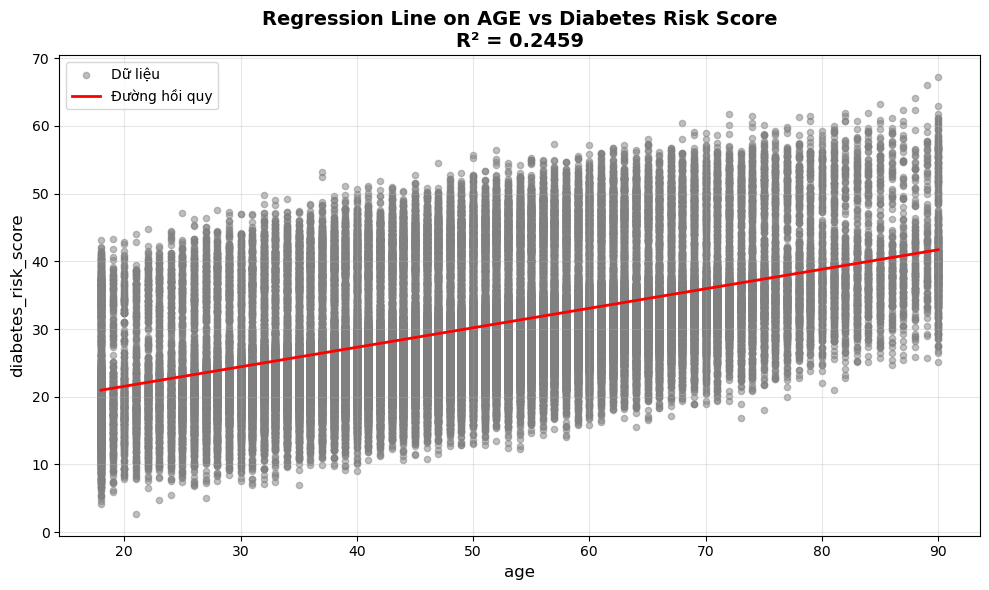

  R² Score: 0.2459
  Hệ số hồi quy: 0.2880
  Hệ số chặn: 15.7887

Vẽ đường hồi quy cho physical_activity_minutes_per_week vs diabetes_risk_score


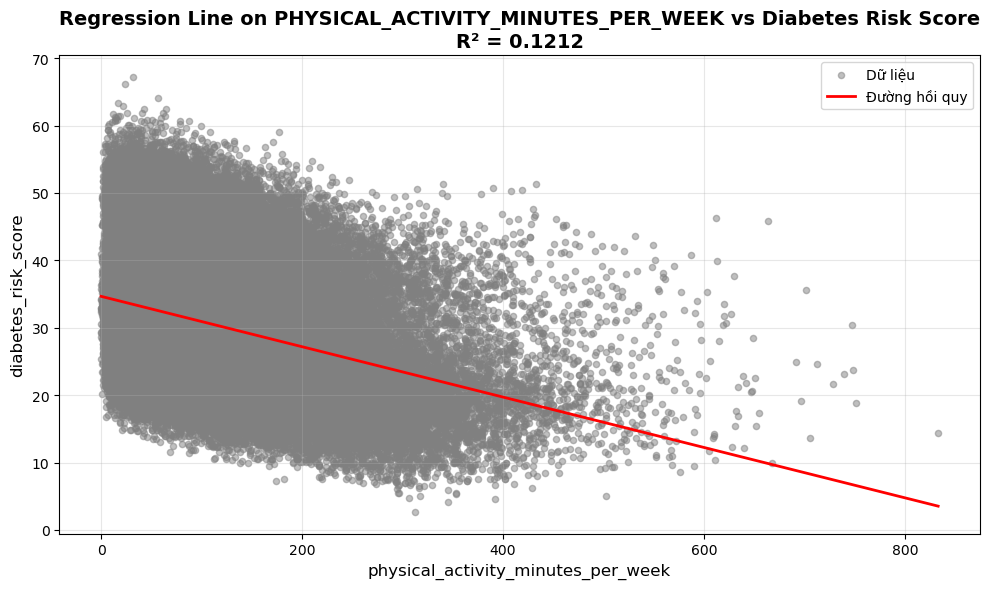

  R² Score: 0.1212
  Hệ số hồi quy: -0.0374
  Hệ số chặn: 34.6662

Vẽ đường hồi quy cho diet_score vs diabetes_risk_score


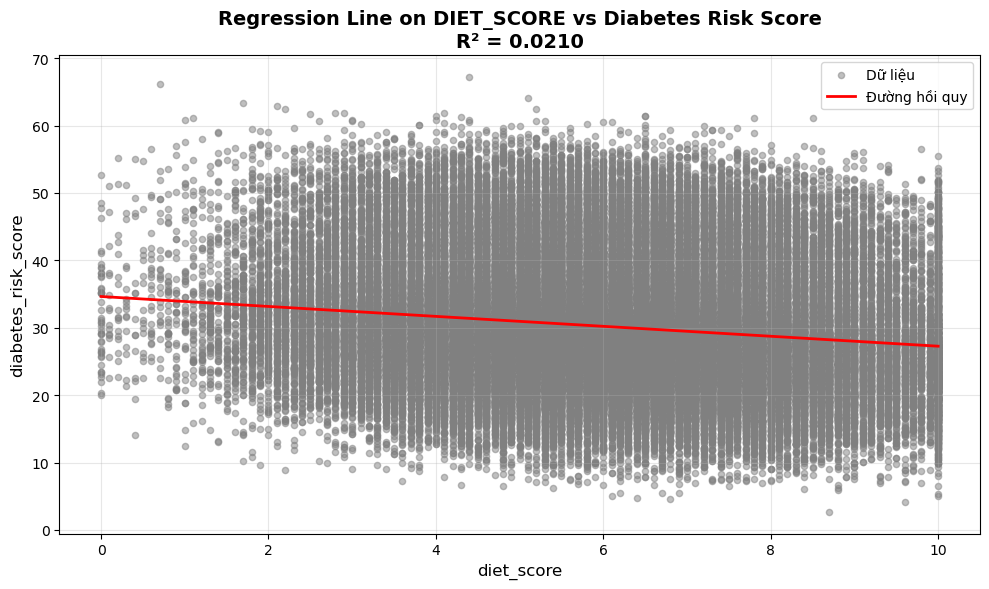

  R² Score: 0.0210
  Hệ số hồi quy: -0.7372
  Hệ số chặn: 34.6418

Vẽ đường hồi quy cho bmi vs diabetes_risk_score


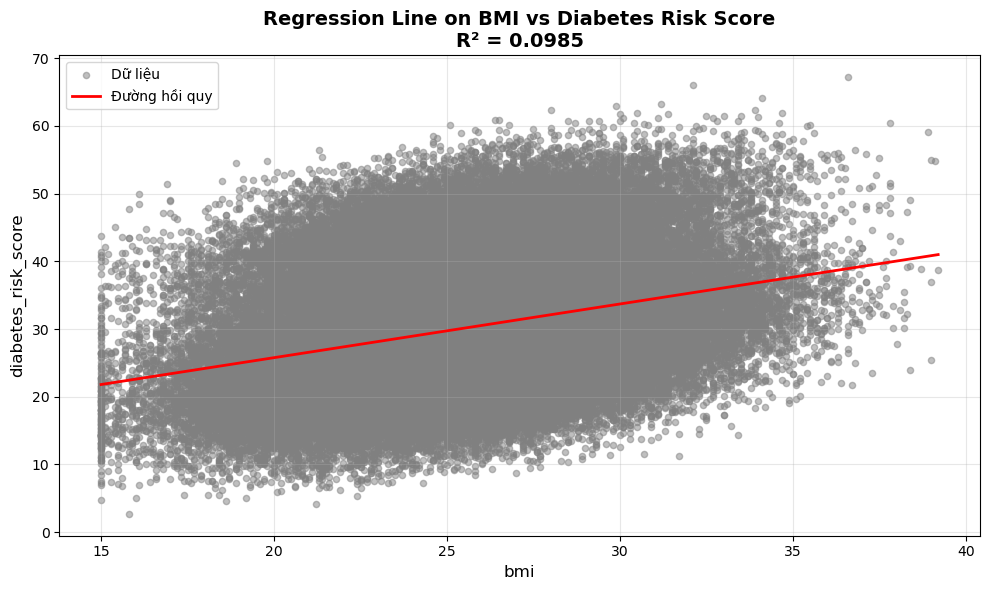

  R² Score: 0.0985
  Hệ số hồi quy: 0.7928
  Hệ số chặn: 9.9161

Vẽ đường hồi quy cho systolic_bp vs diabetes_risk_score


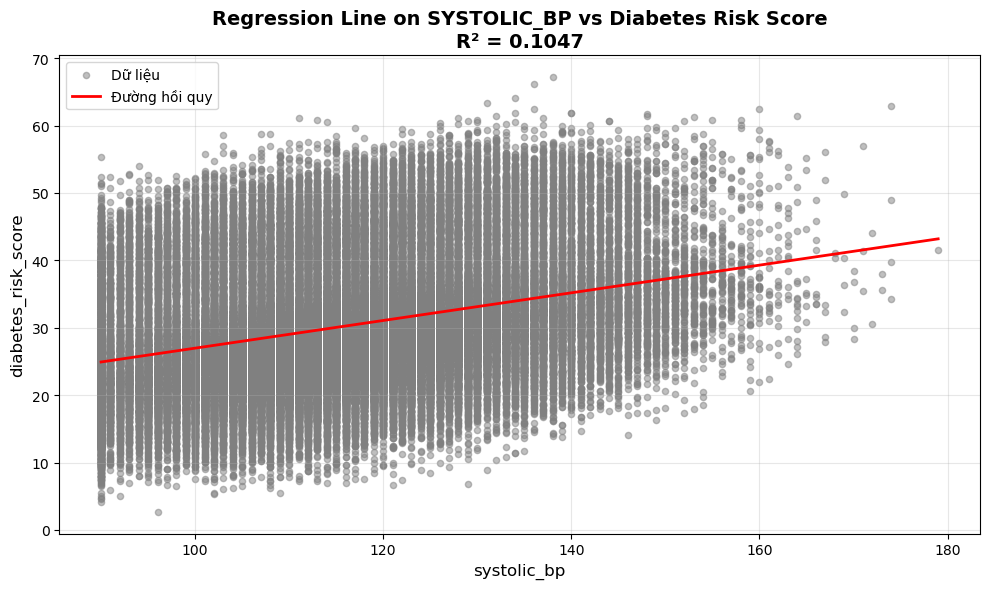

  R² Score: 0.1047
  Hệ số hồi quy: 0.2053
  Hệ số chặn: 6.4511

Vẽ đường hồi quy cho hdl_cholesterol vs diabetes_risk_score


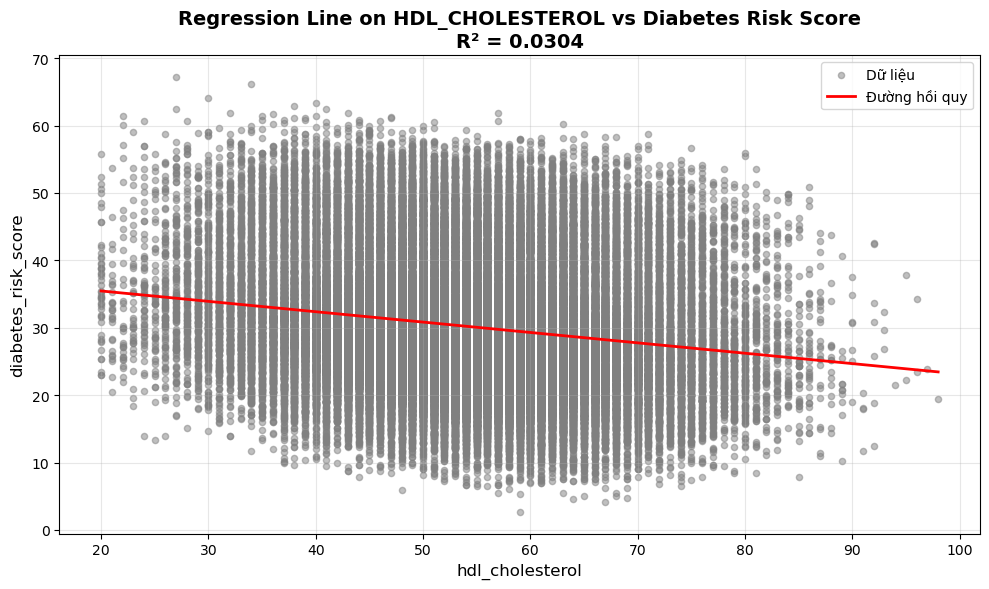

  R² Score: 0.0304
  Hệ số hồi quy: -0.1540
  Hệ số chặn: 38.5433

Vẽ đường hồi quy cho ldl_cholesterol vs diabetes_risk_score


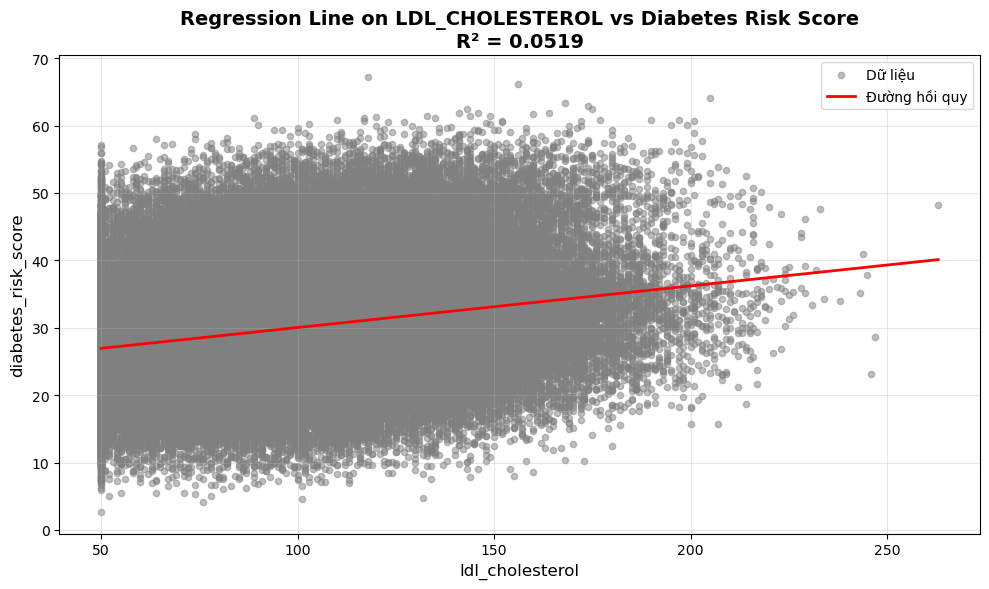

  R² Score: 0.0519
  Hệ số hồi quy: 0.0618
  Hệ số chặn: 23.8556

Vẽ đường hồi quy cho triglycerides vs diabetes_risk_score


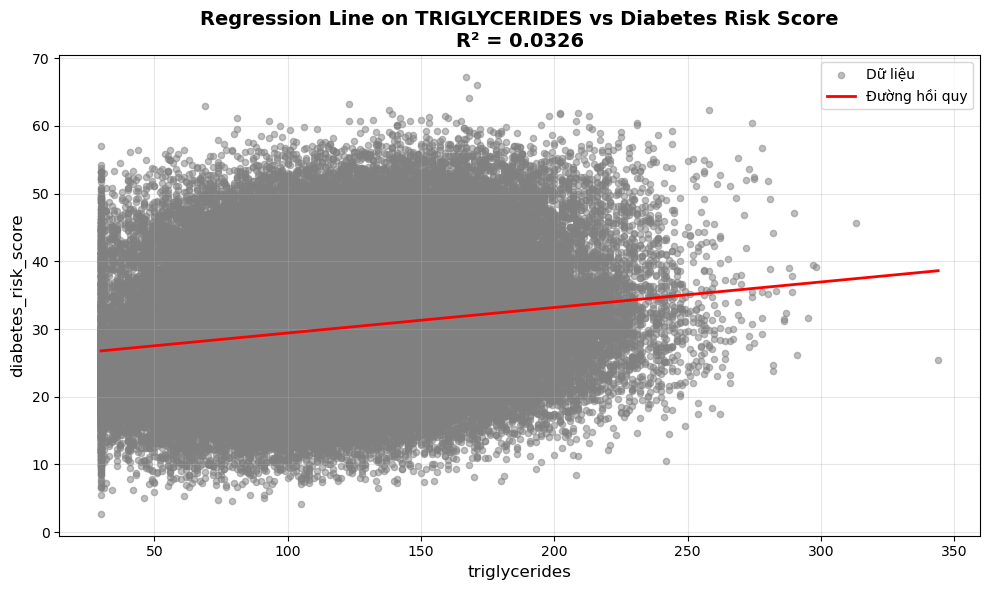

  R² Score: 0.0326
  Hệ số hồi quy: 0.0377
  Hệ số chặn: 25.6423

Vẽ đường hồi quy cho glucose_fasting vs diabetes_risk_score


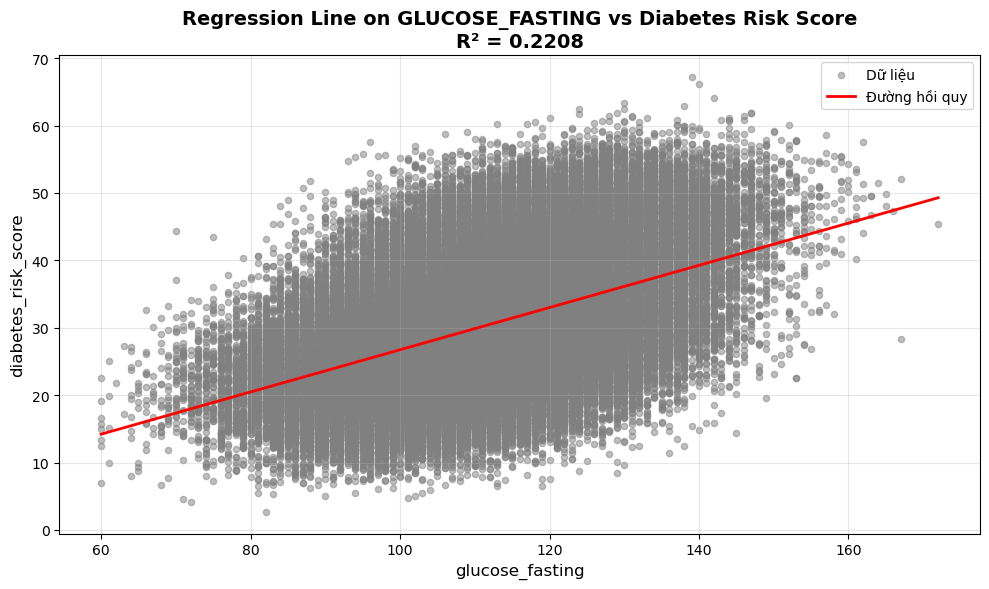

  R² Score: 0.2208
  Hệ số hồi quy: 0.3132
  Hệ số chặn: -4.5812

Vẽ đường hồi quy cho hba1c vs diabetes_risk_score


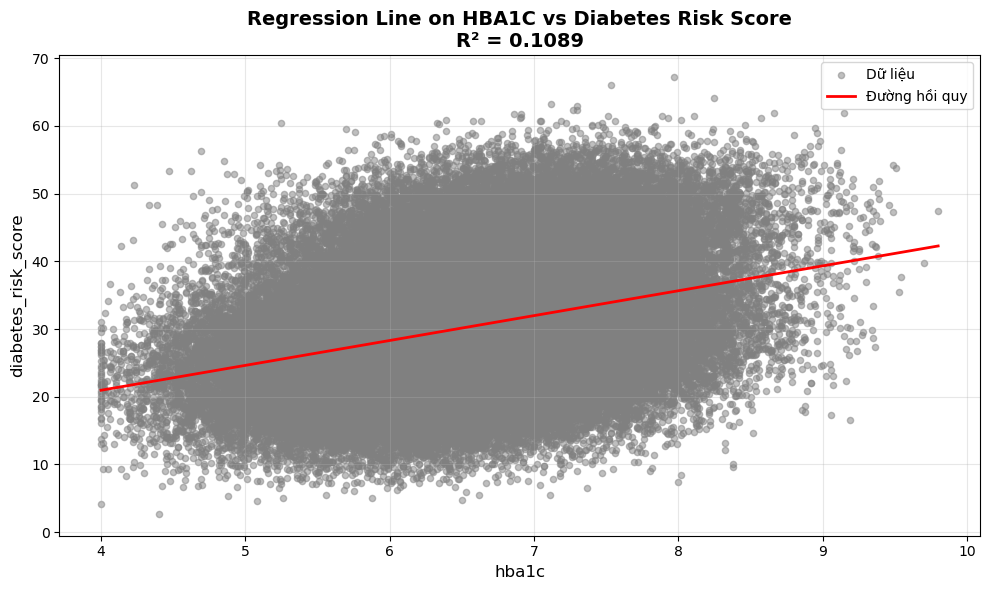

  R² Score: 0.1089
  Hệ số hồi quy: 3.6734
  Hệ số chặn: 6.2693

✅ Đã vẽ 10 biểu đồ hồi quy


In [24]:
# Vẽ đường hồi quy cho các cột số với diabetes_risk_score
print("=== VẼ ĐƯỜNG HỒI QUY CHO CÁC CỘT SỐ VỚI DIABETES_RISK_SCORE ===")

# Lấy dữ liệu
df_reg_plot = df.toPandas()

# Lấy các cột số (loại trừ diabetes_risk_score)
numeric_cols_reg = [col for col in df_reg_plot.columns 
                    if col != 'diabetes_risk_score']

print(f"Các cột số: {numeric_cols_reg}")

# Kiểm tra xem có cột diabetes_risk_score không
if 'diabetes_risk_score' not in df_reg_plot.columns:
    print("⚠️ Cảnh báo: Không tìm thấy cột 'diabetes_risk_score'")
else:
    # Vẽ biểu đồ hồi quy cho từng cột
    for col_name in numeric_cols_reg:
        print(f"\nVẽ đường hồi quy cho {col_name} vs diabetes_risk_score")
        
        # Tạo figure
        plt.figure(figsize=(10, 6))
        
        # Vẽ scatter plot
        plt.scatter(df_reg_plot[col_name], df_reg_plot['diabetes_risk_score'], 
                   alpha=0.5, s=20, color='gray', label='Dữ liệu')
        
        # Tính và vẽ đường hồi quy
        X_col = df_reg_plot[[col_name]].values
        y_col = df_reg_plot['diabetes_risk_score'].values
        
        # Xây dựng mô hình hồi quy
        model_reg = SklearnLinearRegression()
        model_reg.fit(X_col, y_col)
        
        # Dự đoán
        y_pred_line = model_reg.predict(X_col)
        
        # Sắp xếp để vẽ đường thẳng
        sort_idx = X_col.flatten().argsort()
        plt.plot(X_col[sort_idx], y_pred_line[sort_idx], 
                color='red', linewidth=2, label='Đường hồi quy')
        
        # Tính R² score
        r2_score = model_reg.score(X_col, y_col)
        
        plt.title(f"Regression Line on {col_name.upper()} vs Diabetes Risk Score\nR² = {r2_score:.4f}", 
                 fontsize=14, fontweight='bold')
        plt.xlabel(col_name, fontsize=12)
        plt.ylabel('diabetes_risk_score', fontsize=12)
        plt.legend(loc='best')
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
        
        print(f"  R² Score: {r2_score:.4f}")
        print(f"  Hệ số hồi quy: {model_reg.coef_[0]:.4f}")
        print(f"  Hệ số chặn: {model_reg.intercept_:.4f}")
    
    print(f"\n✅ Đã vẽ {len(numeric_cols_reg)} biểu đồ hồi quy")

In [25]:
# Mô tả thống kê bằng PySpark
print("\n=== THỐNG KÊ MÔ TẢ CHI TIẾT (PYSPARK) ===")

# Lấy danh sách các cột số
numeric_cols = [field.name for field in df.schema.fields 
                if str(field.dataType) in ["IntegerType()", "DoubleType()", "FloatType()", "LongType()"]]

print(f"Các cột số: {numeric_cols}\n")

# Dictionary để lưu kết quả
stats_dict = {}

# Tính thống kê cho từng cột
for col_name in numeric_cols:
    print(f"=== Thống kê cho cột: {col_name} ===")
    
    # Tính các chỉ số thống kê
    kq = df.select(
        max(col_name).alias('max'),
        min(col_name).alias('min'),
        stddev(col_name).alias('std'),
        variance(col_name).alias('var'),
        percentile_approx(col_name, 0.25, 10000000).alias('Q1'),
        percentile_approx(col_name, 0.5, 10000000).alias('Q2'),
        percentile_approx(col_name, 0.75, 10000000).alias('Q3'),
        count(col_name).alias('count')
    )
    
    # Hiển thị kết quả
    kq.show()
    
    # Lấy giá trị và lưu vào dictionary
    row = kq.first()
    stats_list = [
        row['max'], 
        row['min'], 
        row['std'], 
        row['var'], 
        row['Q1'], 
        row['Q2'], 
        row['Q3'],
        row['count']
    ]
    
    stats_dict[col_name] = stats_list
    
    # In ra dạng list
    print(f"Kết quả: {stats_list}\n")

# Hiển thị toàn bộ dictionary
print("=== TẤT CẢ THỐNG KÊ ===")
print(stats_dict)

# Chuyển sang DataFrame pandas để lưu file
stats_df = pd.DataFrame.from_dict(
    stats_dict, 
    orient='index',
    columns=['max', 'min', 'std', 'var', 'Q1', 'Q2_median', 'Q3', 'count']
)

print("\n=== BẢNG THỐNG KÊ TỔNG HỢP ===")
print(stats_df)

# Lưu ra file CSV
stats_df.to_csv("output/statistics_pyspark.csv")
print("\n✅ Đã lưu thống kê vào output/statistics_pyspark.csv")


=== THỐNG KÊ MÔ TẢ CHI TIẾT (PYSPARK) ===
Các cột số: ['age', 'physical_activity_minutes_per_week', 'diet_score', 'bmi', 'systolic_bp', 'hdl_cholesterol', 'ldl_cholesterol', 'triglycerides', 'glucose_fasting', 'hba1c', 'diabetes_risk_score']

=== Thống kê cho cột: age ===
+---+---+------------------+-----------------+---+---+---+------+
|max|min|               std|              var| Q1| Q2| Q3| count|
+---+---+------------------+-----------------+---+---+---+------+
| 90| 18|15.604599529214607|243.5035264671647| 39| 50| 61|100000|
+---+---+------------------+-----------------+---+---+---+------+

Kết quả: [90, 18, 15.604599529214607, 243.5035264671647, 39, 50, 61, 100000]

=== Thống kê cho cột: physical_activity_minutes_per_week ===
+---+---+-----------------+-----------------+---+---+---+------+
|max|min|              std|              var| Q1| Q2| Q3| count|
+---+---+-----------------+-----------------+---+---+---+------+
|833|  0|84.40966249441847|7124.991122421636| 57|100|160|1000

=== CHUẨN HÓA Z-SCORE VÀ VẼ BIỂU ĐỒ BOXPLOT ===
Các cột số cần chuẩn hóa: ['age', 'physical_activity_minutes_per_week', 'diet_score', 'bmi', 'systolic_bp', 'hdl_cholesterol', 'ldl_cholesterol', 'triglycerides', 'glucose_fasting', 'hba1c', 'diabetes_risk_score']

✅ Đã chuẩn hóa Z-score cho 11 cột


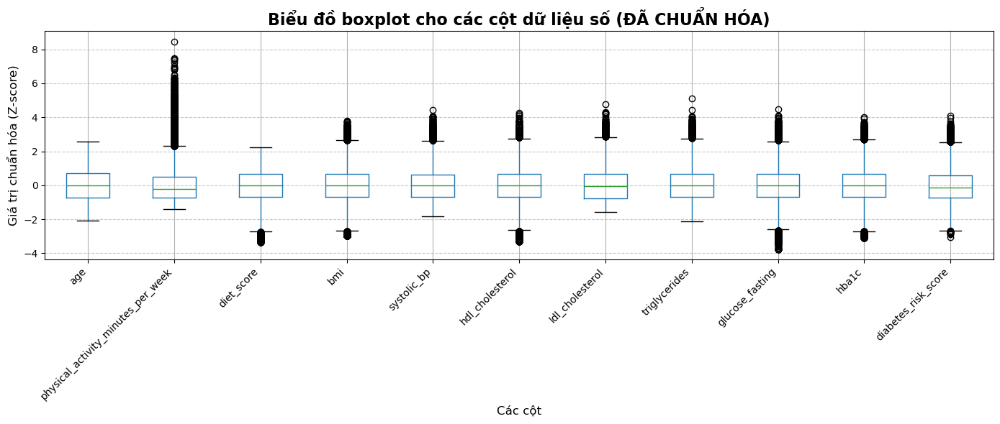


✅ Đã vẽ biểu đồ boxplot cho các cột số (đã chuẩn hóa Z-score)


In [26]:
# Chuẩn hóa Z-score và vẽ biểu đồ boxplot
print("=== CHUẨN HÓA Z-SCORE VÀ VẼ BIỂU ĐỒ BOXPLOT ===")

# Lấy dữ liệu
df_numeric = df.toPandas()

# Lấy các cột số (loại trừ gender, smoking_status)
numeric_cols = [col for col in df_numeric.columns ]

print(f"Các cột số cần chuẩn hóa: {numeric_cols}")

# Chuẩn hóa Z-score cho các cột số
df_zscore = df_numeric[numeric_cols].apply(stats.zscore)

print(f"\n✅ Đã chuẩn hóa Z-score cho {len(numeric_cols)} cột")

# Vẽ boxplot
plt.figure(figsize=(14, 6))
df_zscore.boxplot(figsize=(14, 6))
plt.title('Biểu đồ boxplot cho các cột dữ liệu số (ĐÃ CHUẨN HÓA)', 
          fontsize=16, fontweight='bold')
plt.xlabel('Các cột', fontsize=12)
plt.ylabel('Giá trị chuẩn hóa (Z-score)', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

print("\n✅ Đã vẽ biểu đồ boxplot cho các cột số (đã chuẩn hóa Z-score)")

=== VẼ BOXPLOT RIÊNG CHO TỪNG CỘT SỐ ===
Các cột số: ['age', 'physical_activity_minutes_per_week', 'diet_score', 'bmi', 'systolic_bp', 'hdl_cholesterol', 'ldl_cholesterol', 'triglycerides', 'glucose_fasting', 'hba1c', 'diabetes_risk_score']


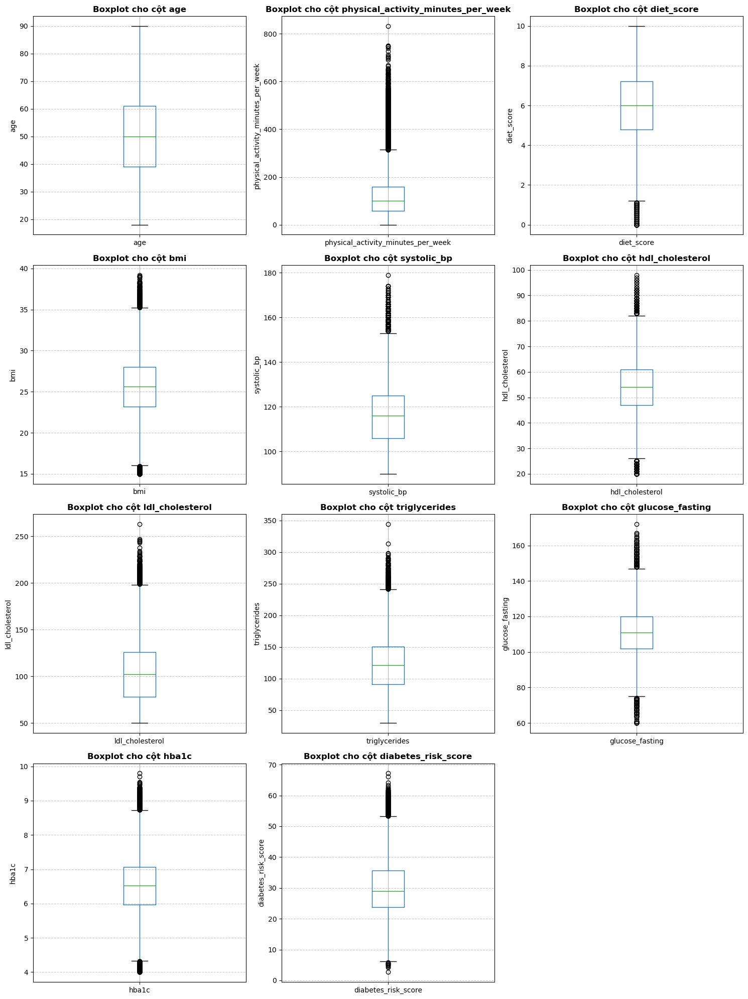


✅ Đã vẽ boxplot riêng cho 11 cột số


In [27]:
# Vẽ boxplot riêng cho TỪNG cột số
print("=== VẼ BOXPLOT RIÊNG CHO TỪNG CỘT SỐ ===")

# Lấy dữ liệu
df_plot_individual = df.toPandas()

# Lấy các cột số - ĐẢM BẢO LÀ PYTHON LIST
numeric_cols_individual = list(df_plot_individual.columns)

print(f"Các cột số: {numeric_cols_individual}")

# Kiểm tra nếu không có cột nào
if len(numeric_cols_individual) == 0:
    print("⚠️ Không có cột số nào để vẽ")
else:
    # Tính số hàng và cột cho subplot
    total_cols = len(numeric_cols_individual)
    cols_per_row = builtins.min(3, total_cols)  # Tối đa 3 cột - dùng builtins.min()
    num_rows = (total_cols + cols_per_row - 1) // cols_per_row  # Làm tròn lên
    
    # Tạo figure với nhiều subplot
    fig, axes = plt.subplots(num_rows, cols_per_row, figsize=(15, 5 * num_rows))
    
    # Xử lý axes để luôn là array
    if num_rows == 1 and cols_per_row == 1:
        axes = [axes]
    elif num_rows == 1 or cols_per_row == 1:
        axes = axes.flatten()
    else:
        axes = axes.flatten()
    
    # Vẽ boxplot cho từng cột
    for idx, col_name in enumerate(numeric_cols_individual):
        df_plot_individual.boxplot(column=col_name, ax=axes[idx])
        axes[idx].set_title(f'Boxplot cho cột {col_name}', fontsize=12, fontweight='bold')
        axes[idx].set_ylabel(col_name, fontsize=10)
        axes[idx].grid(axis='y', linestyle='--', alpha=0.7)
    
    # Ẩn các subplot thừa
    for idx in range(len(numeric_cols_individual), len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"\n✅ Đã vẽ boxplot riêng cho {len(numeric_cols_individual)} cột số")

=== VẼ BIỂU ĐỒ JOINTPLOT GIỮA CÁC CỘT SỐ VÀ DIABETES_RISK_SCORE ===
Các cột số: ['age', 'physical_activity_minutes_per_week', 'diet_score', 'bmi', 'systolic_bp', 'hdl_cholesterol', 'ldl_cholesterol', 'triglycerides', 'glucose_fasting', 'hba1c']

Vẽ jointplot cho age vs diabetes_risk_score


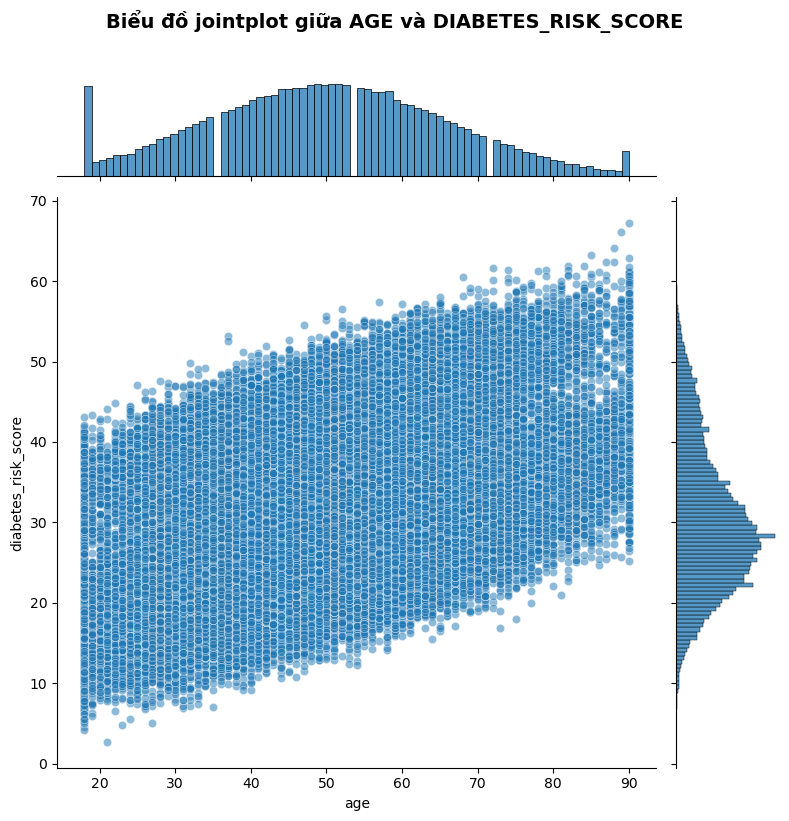


Vẽ jointplot cho physical_activity_minutes_per_week vs diabetes_risk_score


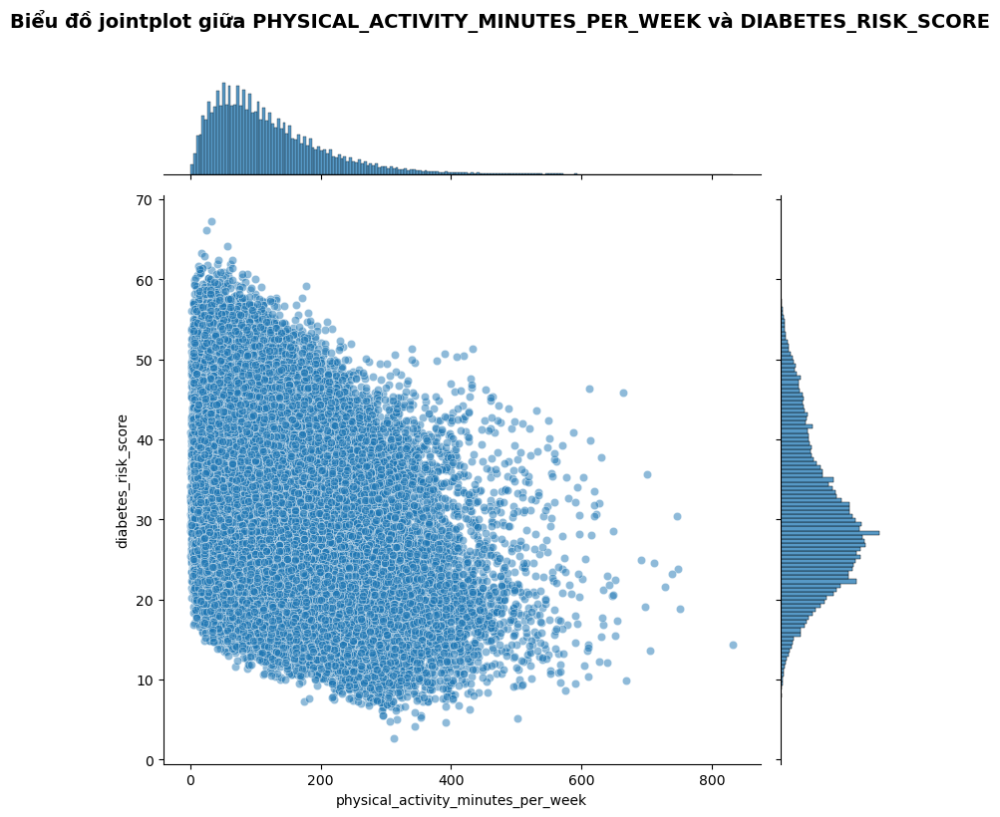


Vẽ jointplot cho diet_score vs diabetes_risk_score


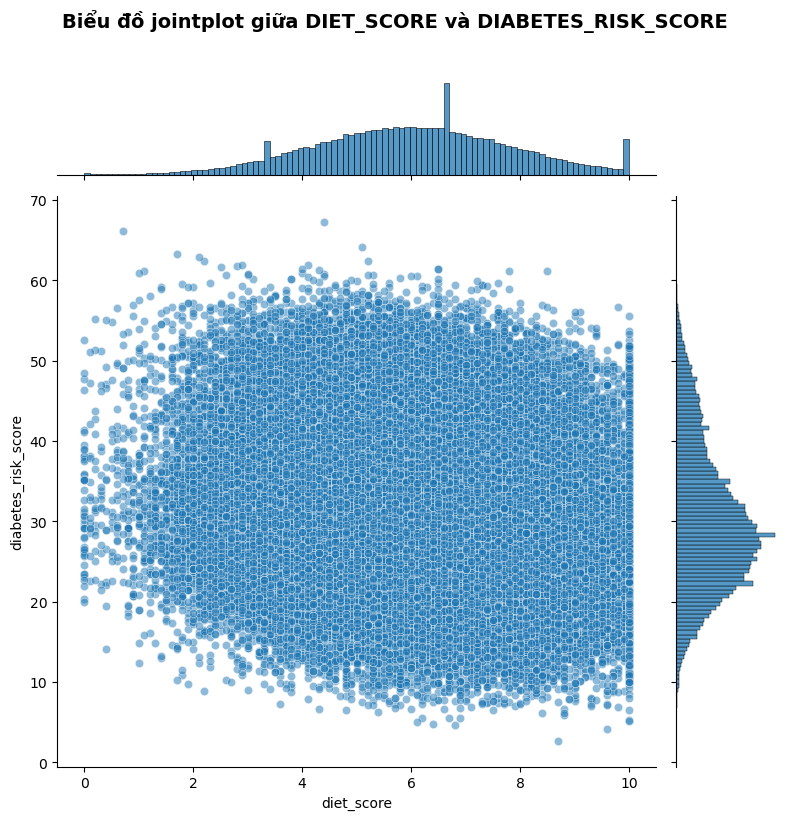


Vẽ jointplot cho bmi vs diabetes_risk_score


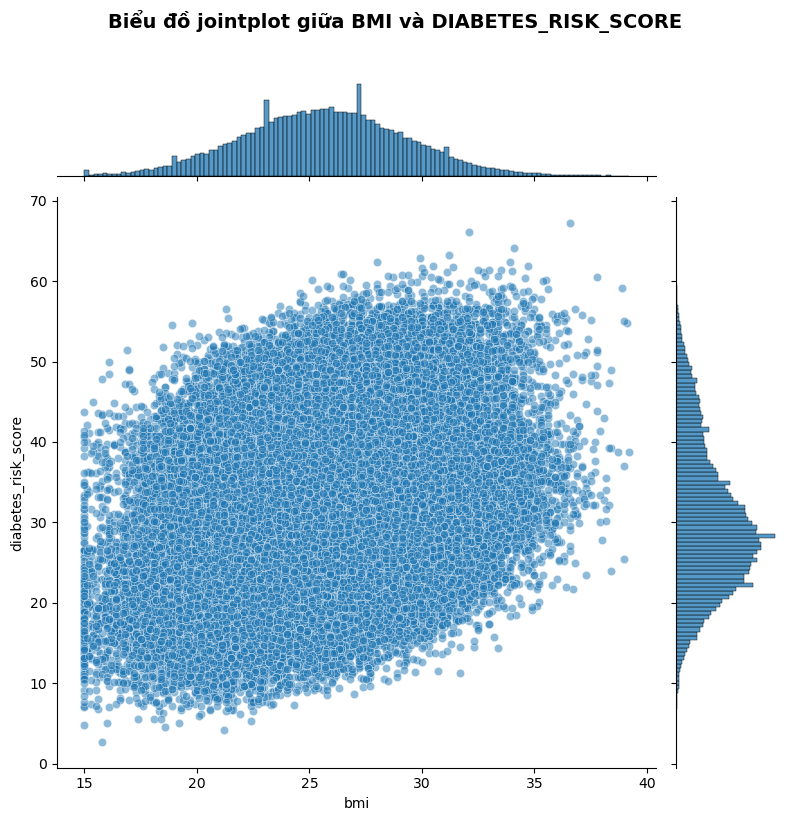


Vẽ jointplot cho systolic_bp vs diabetes_risk_score


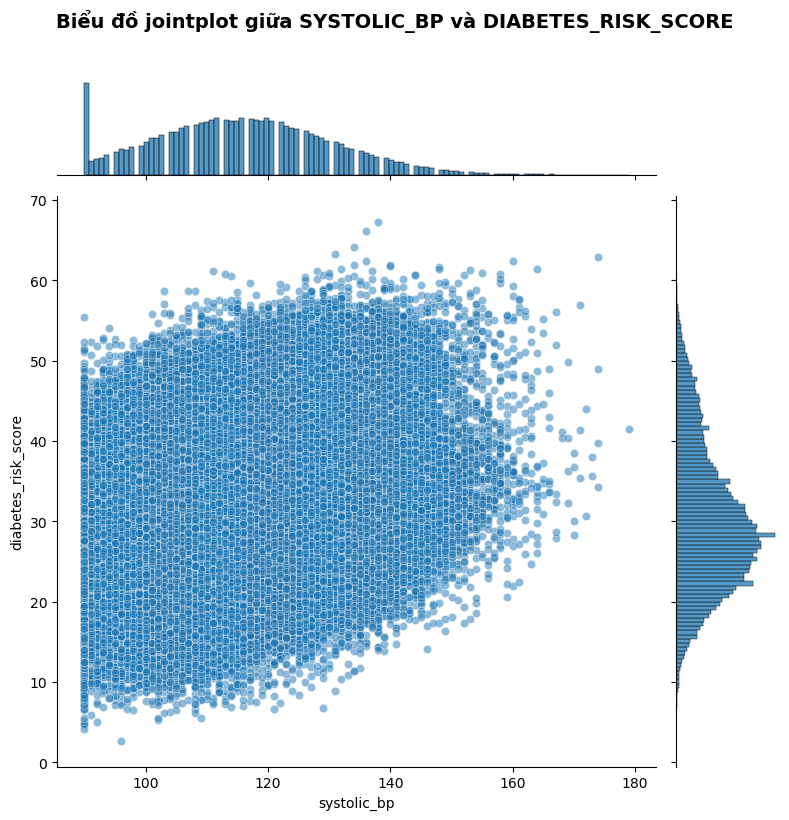


Vẽ jointplot cho hdl_cholesterol vs diabetes_risk_score


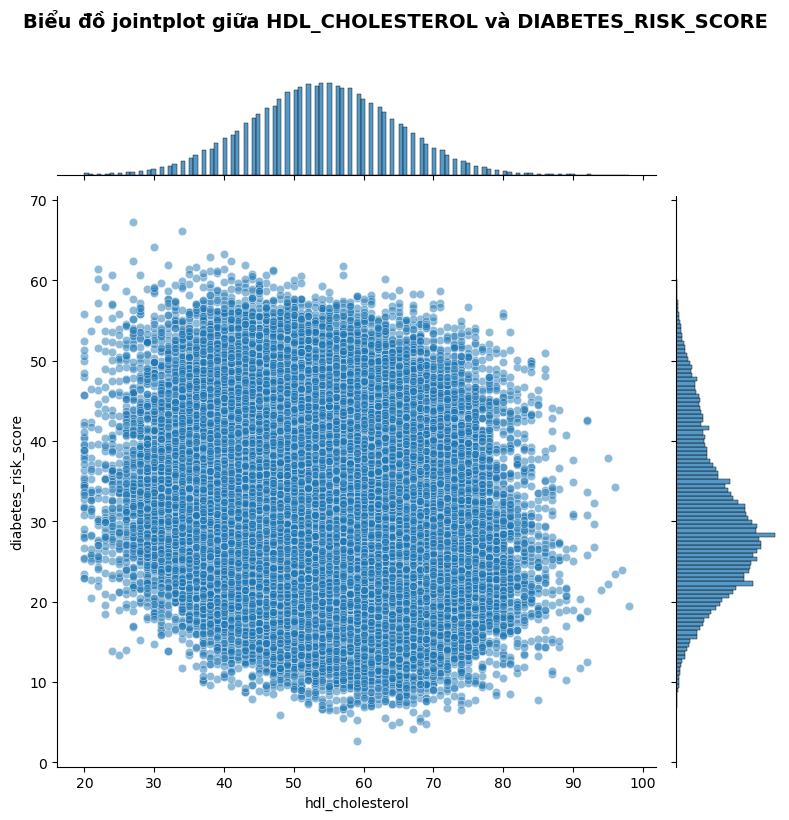


Vẽ jointplot cho ldl_cholesterol vs diabetes_risk_score


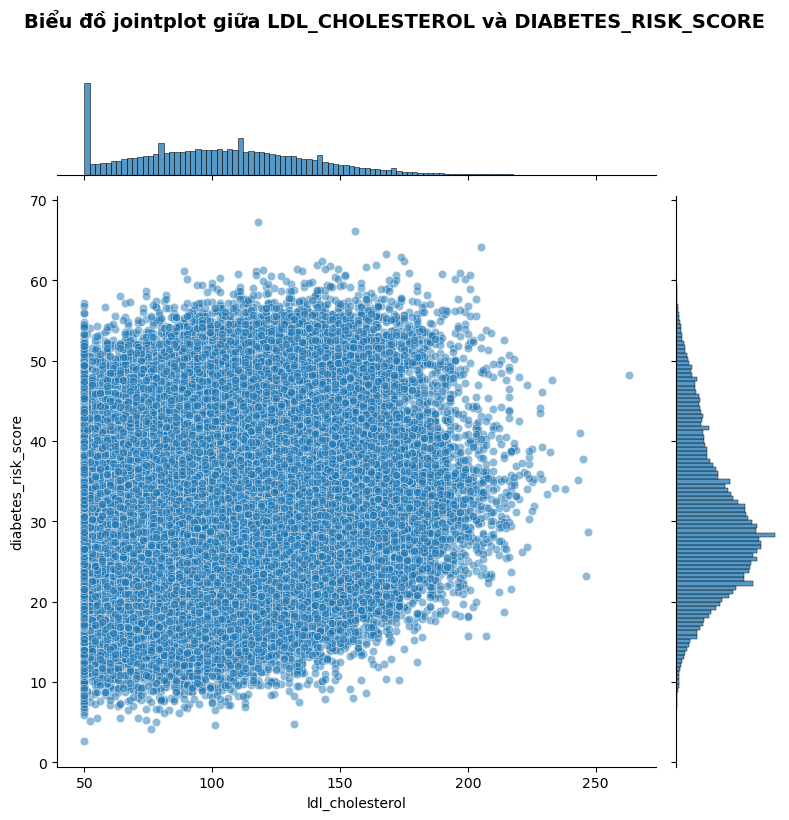


Vẽ jointplot cho triglycerides vs diabetes_risk_score


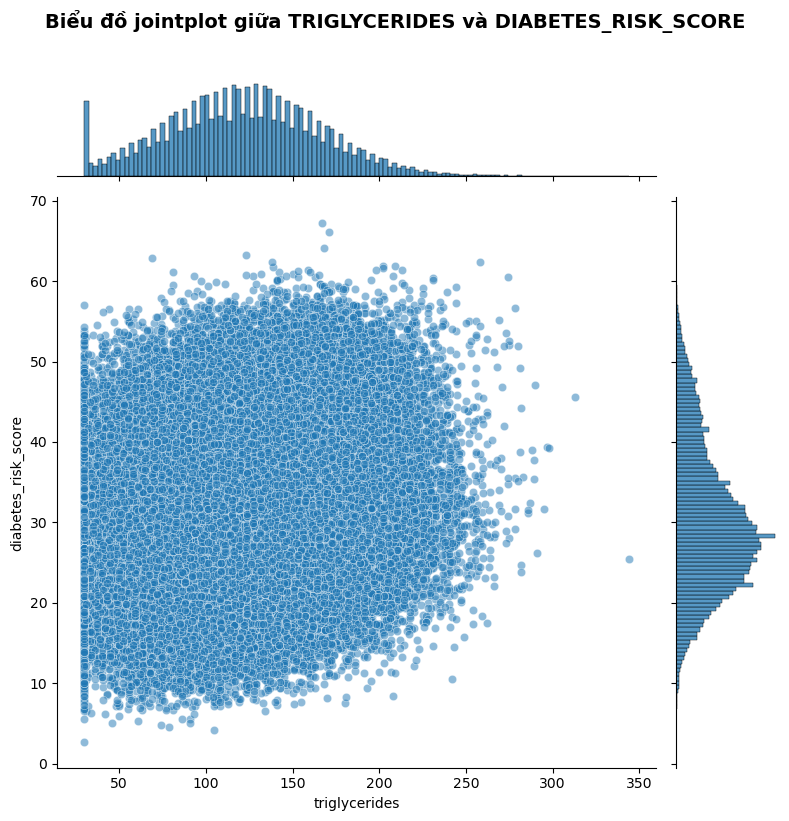


Vẽ jointplot cho glucose_fasting vs diabetes_risk_score


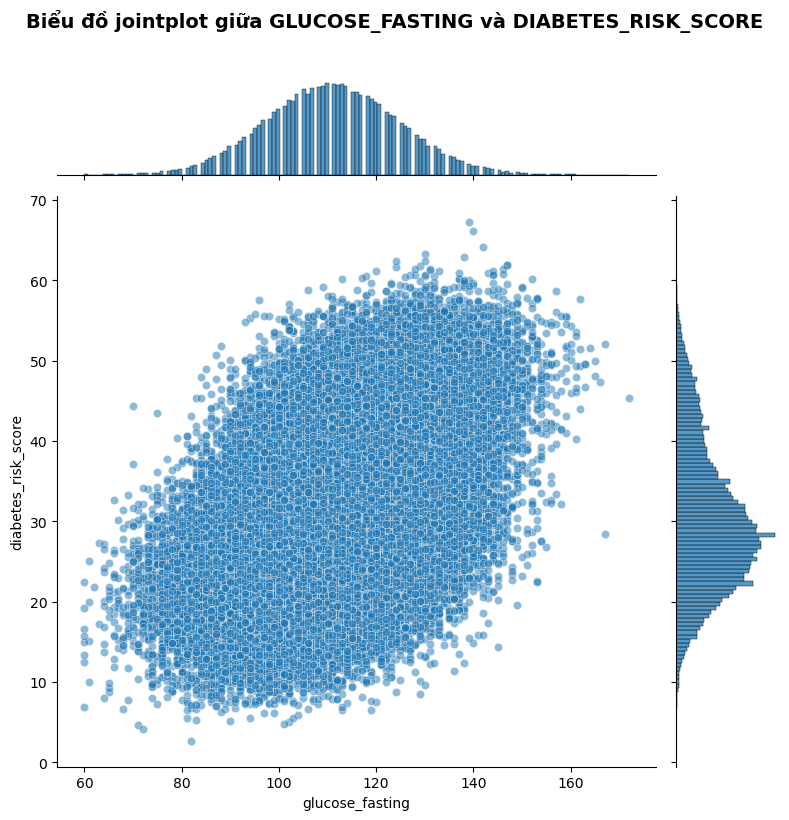


Vẽ jointplot cho hba1c vs diabetes_risk_score


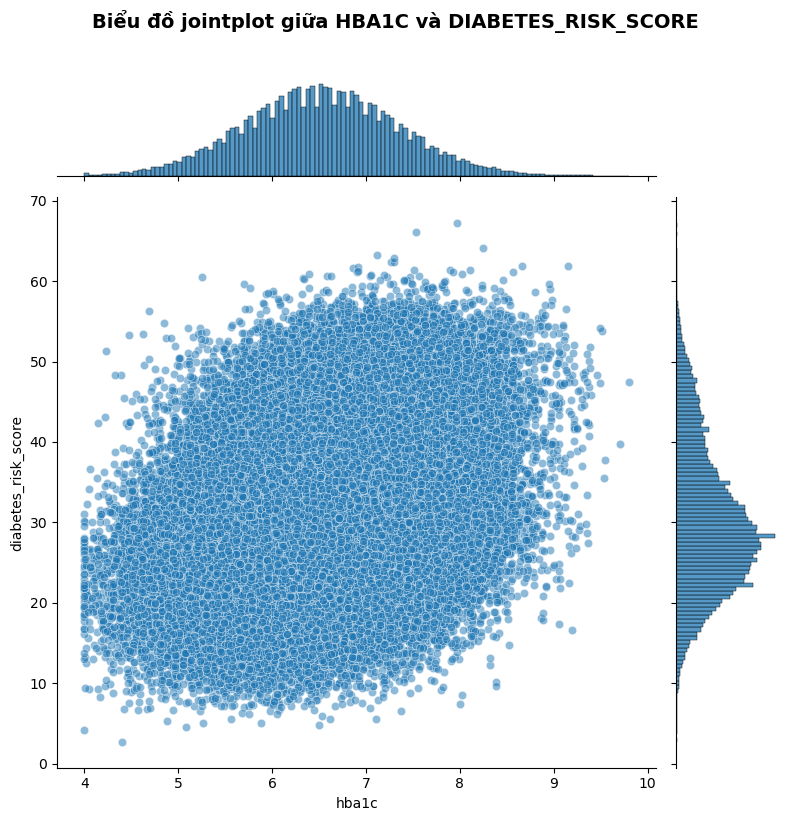


✅ Đã vẽ 10 biểu đồ jointplot


In [28]:
# Vẽ biểu đồ jointplot giữa các cột số và diabetes_risk_score
print("=== VẼ BIỂU ĐỒ JOINTPLOT GIỮA CÁC CỘT SỐ VÀ DIABETES_RISK_SCORE ===")

# Lấy dữ liệu
df_joint = df.toPandas()

# Lấy các cột số (loại trừ gender, smoking_status và diabetes_risk_score)
numeric_cols_joint = [col for col in df_joint.columns 
                      if col not in [ 'diabetes_risk_score']]

print(f"Các cột số: {numeric_cols_joint}")

# Kiểm tra xem có cột diabetes_risk_score không
if 'diabetes_risk_score' not in df_joint.columns:
    print("⚠️ Cảnh báo: Không tìm thấy cột 'diabetes_risk_score'")
else:
    # Vẽ jointplot cho từng cột với diabetes_risk_score
    for col_name in numeric_cols_joint:
        print(f"\nVẽ jointplot cho {col_name} vs diabetes_risk_score")
        
        # Tạo jointplot
        g = sns.jointplot(data=df_joint, x=col_name, y='diabetes_risk_score', 
                         kind='scatter', height=8, alpha=0.5)
        
        g.fig.suptitle(f'Biểu đồ jointplot giữa {col_name.upper()} và DIABETES_RISK_SCORE', 
                      fontsize=14, fontweight='bold', y=1.02)
        
        plt.tight_layout()
        plt.show()
    
    print(f"\n✅ Đã vẽ {len(numeric_cols_joint)} biểu đồ jointplot")

=== VẼ BIỂU ĐỒ PHÂN PHỐI CHO DIABETES_RISK_SCORE ===


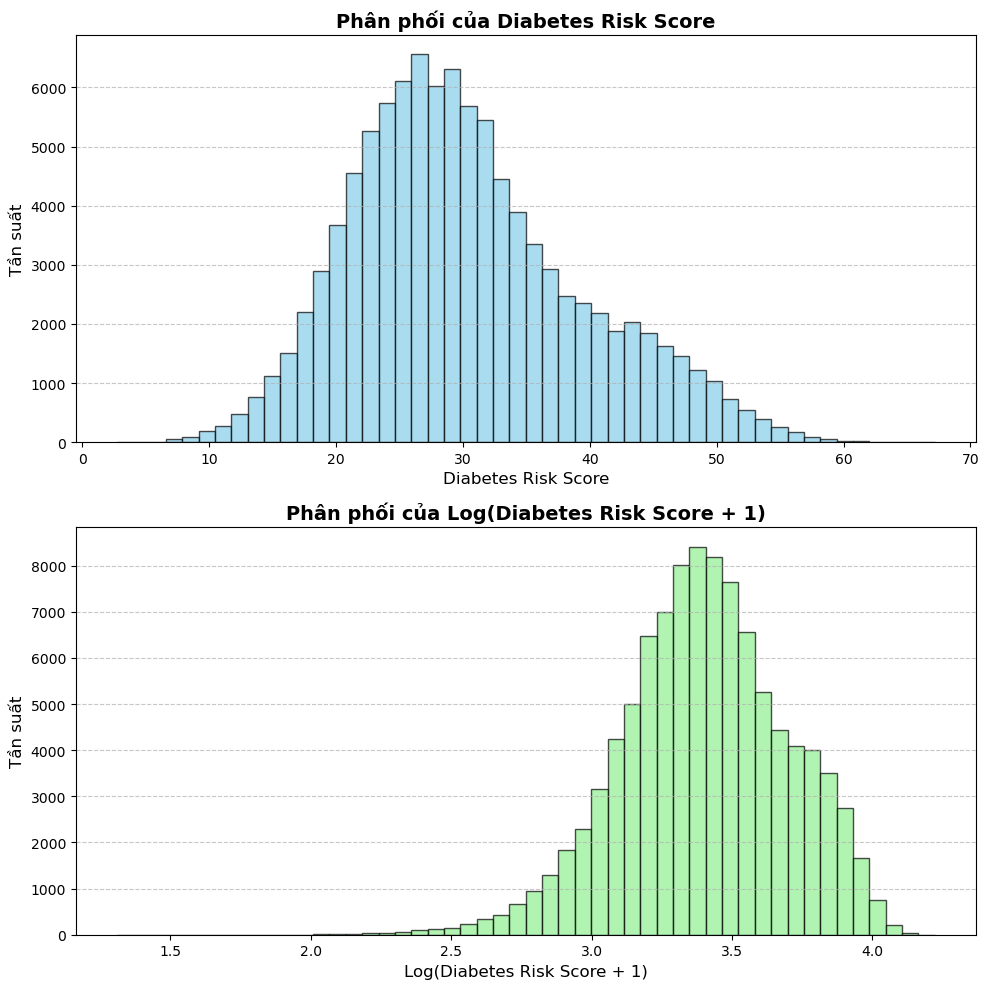


✅ Đã vẽ biểu đồ phân phối cho diabetes_risk_score

=== THỐNG KÊ DIABETES_RISK_SCORE ===
count    100000.000000
mean         30.222362
std           9.061505
min           2.700000
25%          23.800000
50%          29.000000
75%          35.600000
max          67.200000
Name: diabetes_risk_score, dtype: float64


In [29]:
# Vẽ biểu đồ phân phối cho diabetes_risk_score
print("=== VẼ BIỂU ĐỒ PHÂN PHỐI CHO DIABETES_RISK_SCORE ===")

# Lấy dữ liệu
df_dist = df.toPandas()

# Kiểm tra cột diabetes_risk_score
if 'diabetes_risk_score' not in df_dist.columns:
    print("⚠️ Cảnh báo: Không tìm thấy cột 'diabetes_risk_score'")
else:
    # Tạo figure với 2 subplot
    fig, axes = plt.subplots(2, 1, figsize=(10, 10))
    
    # Biểu đồ 1: Phân phối gốc của diabetes_risk_score
    axes[0].hist(df_dist['diabetes_risk_score'], bins=50, color='skyblue', edgecolor='black', alpha=0.7)
    axes[0].set_title('Phân phối của Diabetes Risk Score', fontsize=14, fontweight='bold')
    axes[0].set_xlabel('Diabetes Risk Score', fontsize=12)
    axes[0].set_ylabel('Tần suất', fontsize=12)
    axes[0].grid(axis='y', linestyle='--', alpha=0.7)
    
    # Biểu đồ 2: Phân phối của Log(diabetes_risk_score + 1)
    df_dist['log_risk_score'] = np.log(df_dist['diabetes_risk_score'] + 1)
    axes[1].hist(df_dist['log_risk_score'], bins=50, color='lightgreen', edgecolor='black', alpha=0.7)
    axes[1].set_title('Phân phối của Log(Diabetes Risk Score + 1)', fontsize=14, fontweight='bold')
    axes[1].set_xlabel('Log(Diabetes Risk Score + 1)', fontsize=12)
    axes[1].set_ylabel('Tần suất', fontsize=12)
    axes[1].grid(axis='y', linestyle='--', alpha=0.7)
    
    plt.tight_layout()
    plt.show()
    
    print("\n✅ Đã vẽ biểu đồ phân phối cho diabetes_risk_score")
    print(f"\n=== THỐNG KÊ DIABETES_RISK_SCORE ===")
    print(df_dist['diabetes_risk_score'].describe())

=== VẼ MA TRẬN SCATTER PLOT CHO CÁC CỘT SỐ ===
Các cột số: ['age', 'physical_activity_minutes_per_week', 'diet_score', 'bmi', 'systolic_bp', 'hdl_cholesterol', 'ldl_cholesterol', 'triglycerides', 'glucose_fasting', 'hba1c', 'diabetes_risk_score']
Số cột: 11
⚠️ Lấy mẫu 5000 dòng để vẽ nhanh hơn

🔄 Đang vẽ ma trận scatter plot (có thể mất vài phút)...


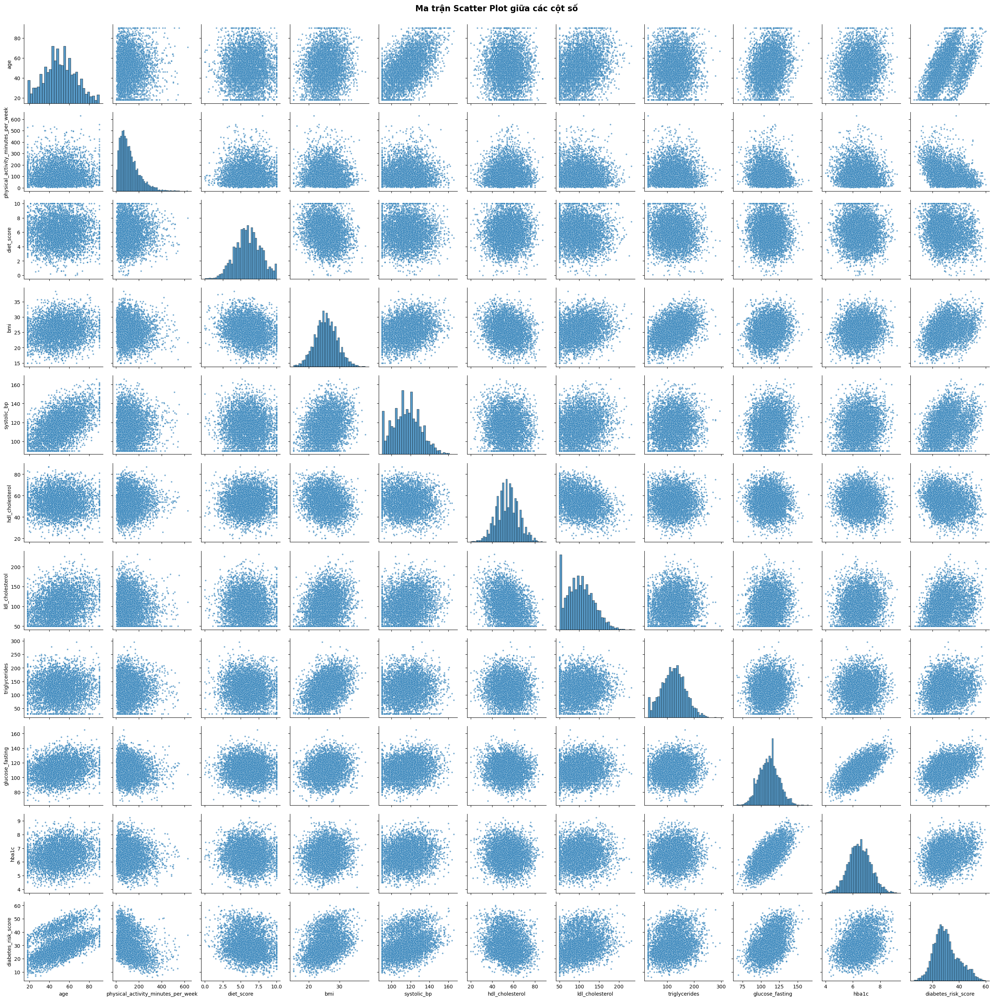


✅ Đã vẽ ma trận scatter plot


In [30]:
# Vẽ ma trận scatter plot cho tất cả các cột số
print("=== VẼ MA TRẬN SCATTER PLOT CHO CÁC CỘT SỐ ===")

# Lấy dữ liệu
df_pairplot = df.toPandas()

# Lấy các cột số 
numeric_cols_pair = [col for col in df_pairplot.columns ]

print(f"Các cột số: {numeric_cols_pair}")
print(f"Số cột: {len(numeric_cols_pair)}")

# Chọn subset dữ liệu (nếu quá nhiều dòng thì lấy mẫu)
if len(df_pairplot) > 5000:
    df_sample = df_pairplot[numeric_cols_pair].sample(n=5000, random_state=42)
    print(f"⚠️ Lấy mẫu 5000 dòng để vẽ nhanh hơn")
else:
    df_sample = df_pairplot[numeric_cols_pair]

# Vẽ pairplot (ma trận scatter)
print("\n🔄 Đang vẽ ma trận scatter plot (có thể mất vài phút)...")

sns.pairplot(df_sample, diag_kind='hist', plot_kws={'alpha': 0.6, 's': 10}, 
             height=2.5, aspect=1)

plt.suptitle('Ma trận Scatter Plot giữa các cột số', 
             fontsize=16, fontweight='bold', y=1.001)
plt.tight_layout()
plt.show()

print("\n✅ Đã vẽ ma trận scatter plot")

=== VẼ BIỂU ĐỒ CHẨN ĐOÁN MÔ HÌNH HỒI QUY ===


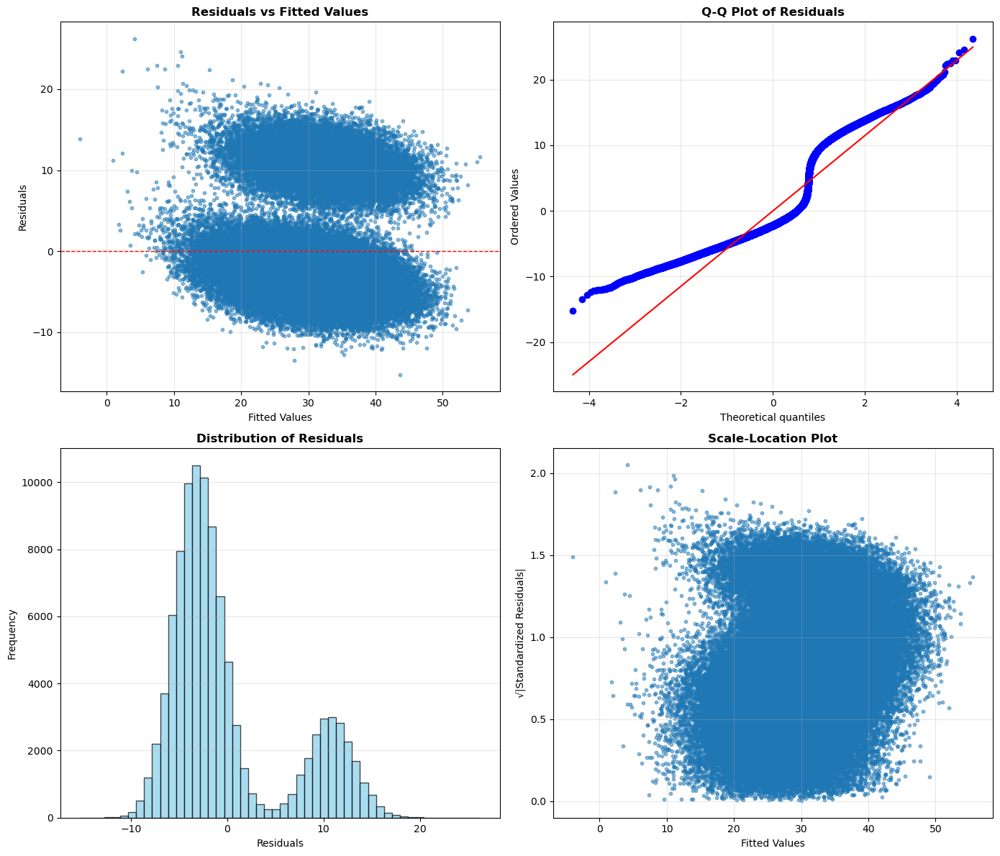


✅ Đã vẽ 4 biểu đồ chẩn đoán mô hình hồi quy

=== THỐNG KÊ MÔ HÌNH ===
R² Score: 0.5266
Mean Residual: 0.0000
Std Residual: 6.2348


In [31]:
# Vẽ biểu đồ chẩn đoán mô hình hồi quy (Regression Diagnostics)
print("=== VẼ BIỂU ĐỒ CHẨN ĐOÁN MÔ HÌNH HỒI QUY ===")

# Lấy dữ liệu
df_regression = df.toPandas()

# Lấy các cột số (loại trừ gender, smoking_status)
numeric_cols_reg = [col for col in df_regression.columns]

# Kiểm tra xem có cột diabetes_risk_score không
if 'diabetes_risk_score' not in df_regression.columns:
    print("⚠️ Cảnh báo: Không tìm thấy cột 'diabetes_risk_score'")
else:
    # Chuẩn bị dữ liệu cho mô hình hồi quy
    X = df_regression[[col for col in numeric_cols_reg if col != 'diabetes_risk_score']]
    y = df_regression['diabetes_risk_score']
    
    # Xây dựng mô hình hồi quy tuyến tính
    model = SklearnLinearRegression()
    model.fit(X, y)
    
    # Dự đoán và tính residuals
    y_pred = model.predict(X)
    residuals = y - y_pred
    
    # Chuẩn hóa residuals
    residuals_std = (residuals - residuals.mean()) / residuals.std()
    
    # Tạo figure với 4 subplot
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))
    
    # 1. Residuals vs Fitted Values
    axes[0, 0].scatter(y_pred, residuals, alpha=0.5, s=10)
    axes[0, 0].axhline(y=0, color='r', linestyle='--', linewidth=1)
    axes[0, 0].set_title('Residuals vs Fitted Values', fontsize=12, fontweight='bold')
    axes[0, 0].set_xlabel('Fitted Values', fontsize=10)
    axes[0, 0].set_ylabel('Residuals', fontsize=10)
    axes[0, 0].grid(True, alpha=0.3)
    
    # 2. Q-Q Plot
    stats.probplot(residuals, dist="norm", plot=axes[0, 1])
    axes[0, 1].set_title('Q-Q Plot of Residuals', fontsize=12, fontweight='bold')
    axes[0, 1].grid(True, alpha=0.3)
    
    # 3. Distribution of Residuals
    axes[1, 0].hist(residuals, bins=50, color='skyblue', edgecolor='black', alpha=0.7)
    axes[1, 0].set_title('Distribution of Residuals', fontsize=12, fontweight='bold')
    axes[1, 0].set_xlabel('Residuals', fontsize=10)
    axes[1, 0].set_ylabel('Frequency', fontsize=10)
    axes[1, 0].grid(axis='y', alpha=0.3)
    
    # 4. Scale-Location Plot
    axes[1, 1].scatter(y_pred, np.sqrt(np.abs(residuals_std)), alpha=0.5, s=10)
    axes[1, 1].set_title('Scale-Location Plot', fontsize=12, fontweight='bold')
    axes[1, 1].set_xlabel('Fitted Values', fontsize=10)
    axes[1, 1].set_ylabel('√|Standardized Residuals|', fontsize=10)
    axes[1, 1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    print("\n✅ Đã vẽ 4 biểu đồ chẩn đoán mô hình hồi quy")
    
    # Thống kê mô hình
    print(f"\n=== THỐNG KÊ MÔ HÌNH ===")
    print(f"R² Score: {model.score(X, y):.4f}")
    print(f"Mean Residual: {residuals.mean():.4f}")
    print(f"Std Residual: {residuals.std():.4f}")

=== VẼ BIỂU ĐỒ HỆ SỐ HỒI QUY - CHỈ CÁC CỘT SỐ ===
Các cột số được sử dụng: ['age', 'physical_activity_minutes_per_week', 'diet_score', 'bmi', 'systolic_bp', 'hdl_cholesterol', 'ldl_cholesterol', 'triglycerides', 'glucose_fasting', 'hba1c']


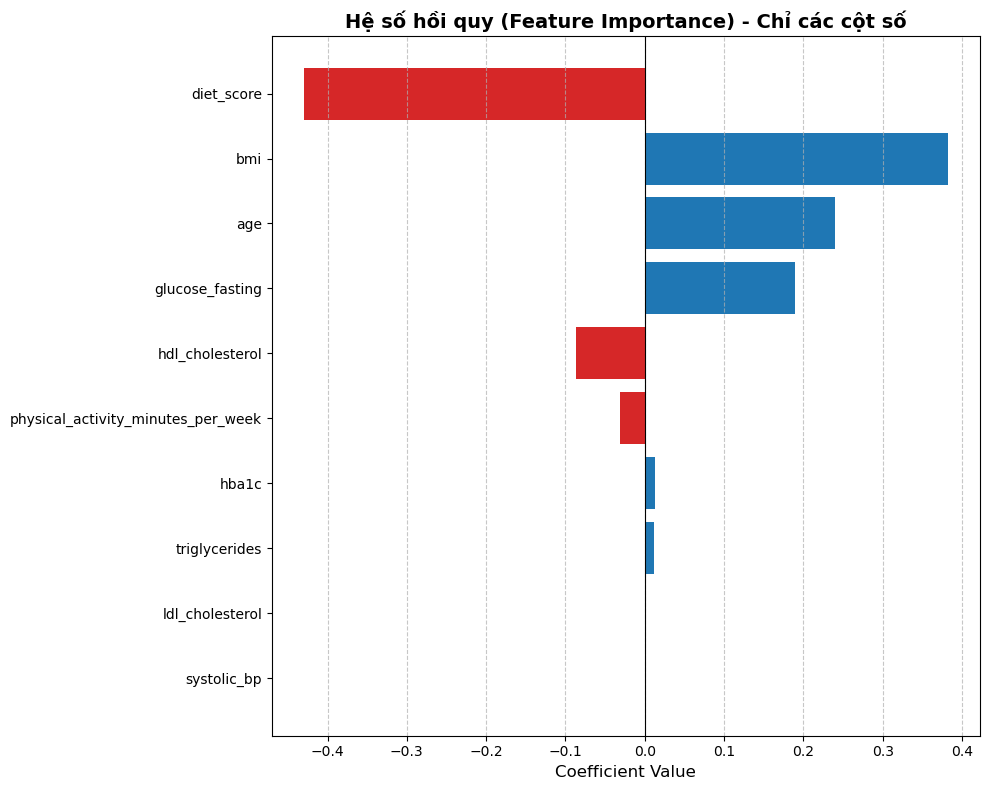


✅ Đã vẽ biểu đồ hệ số hồi quy (chỉ các cột số)

=== HỆ SỐ CỦA TẤT CẢ CÁC FEATURES ===
                           Feature  Coefficient
                        diet_score    -0.429638
                               bmi     0.382089
                               age     0.239563
                   glucose_fasting     0.189904
                   hdl_cholesterol    -0.087224
physical_activity_minutes_per_week    -0.031058
                             hba1c     0.013166
                     triglycerides     0.011529
                   ldl_cholesterol     0.000109
                       systolic_bp    -0.000011

R² Score: 0.5266


In [32]:
# Vẽ biểu đồ Hệ số hồi quy (Feature Importance) - CHỈ CÁC CỘT SỐ
print("=== VẼ BIỂU ĐỒ HỆ SỐ HỒI QUY - CHỈ CÁC CỘT SỐ ===")

# Lấy dữ liệu gốc từ Spark DataFrame
df_feature_numeric = df.toPandas()

# Kiểm tra xem có cột diabetes_risk_score không
if 'diabetes_risk_score' not in df_feature_numeric.columns:
    print("⚠️ Cảnh báo: Không tìm thấy cột 'diabetes_risk_score'")
else:
    # Chỉ lấy các cột số (loại trừ gender, smoking_status và diabetes_risk_score)
    numeric_cols_only = [col for col in df_feature_numeric.columns 
                         if col not in ['diabetes_risk_score']]
    
    print(f"Các cột số được sử dụng: {numeric_cols_only}")
    
    # Chuẩn bị dữ liệu cho mô hình
    X = df_feature_numeric[numeric_cols_only]
    y = df_feature_numeric['diabetes_risk_score']
    
    # Xây dựng mô hình hồi quy tuyến tính
    model = SklearnLinearRegression()
    model.fit(X, y)
    
    # Lấy hệ số hồi quy (coefficients)
    coefficients = model.coef_
    feature_names = X.columns
    
    # Tạo DataFrame để sắp xếp
    coef_df = pd.DataFrame({
        'Feature': feature_names,
        'Coefficient': coefficients
    })
    
    # Sắp xếp theo giá trị tuyệt đối
    coef_df['Abs_Coefficient'] = np.abs(coef_df['Coefficient'])
    coef_df = coef_df.sort_values('Abs_Coefficient', ascending=True)
    
    # Vẽ biểu đồ
    plt.figure(figsize=(10, 8))
    colors = ['#1f77b4' if x >= 0 else '#d62728' for x in coef_df['Coefficient']]
    plt.barh(coef_df['Feature'], coef_df['Coefficient'], color=colors)
    plt.xlabel('Coefficient Value', fontsize=12)
    plt.title('Hệ số hồi quy (Feature Importance) - Chỉ các cột số', 
              fontsize=14, fontweight='bold')
    plt.axvline(x=0, color='black', linestyle='-', linewidth=0.8)
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()
    
    print("\n✅ Đã vẽ biểu đồ hệ số hồi quy (chỉ các cột số)")
    
    # Hiển thị tất cả features và coefficients
    print(f"\n=== HỆ SỐ CỦA TẤT CẢ CÁC FEATURES ===")
    coef_sorted = coef_df.sort_values('Abs_Coefficient', ascending=False)
    print(coef_sorted[['Feature', 'Coefficient']].to_string(index=False))
    
    print(f"\nR² Score: {model.score(X, y):.4f}")

=== VẼ BIỂU ĐỒ LEARNING CURVES ===
Features: ['age', 'physical_activity_minutes_per_week', 'diet_score', 'bmi', 'systolic_bp', 'hdl_cholesterol', 'ldl_cholesterol', 'triglycerides', 'glucose_fasting', 'hba1c']
Label: diabetes_risk_score

Đang tính toán Learning Curves...
Tổng số dòng training: 80272

Training với 5022 dòng...
  Training MSE: 40.21
  Validation MSE: 39.09

Training với 10035 dòng...
  Training MSE: 39.90
  Validation MSE: 39.06

Training với 15104 dòng...
  Training MSE: 39.69
  Validation MSE: 39.07

Training với 20112 dòng...
  Training MSE: 39.32
  Validation MSE: 39.05

Training với 25056 dòng...
  Training MSE: 39.27
  Validation MSE: 39.03

Training với 30053 dòng...
  Training MSE: 39.09
  Validation MSE: 39.03

Training với 35130 dòng...
  Training MSE: 39.10
  Validation MSE: 39.02

Training với 40172 dòng...
  Training MSE: 38.92
  Validation MSE: 39.02


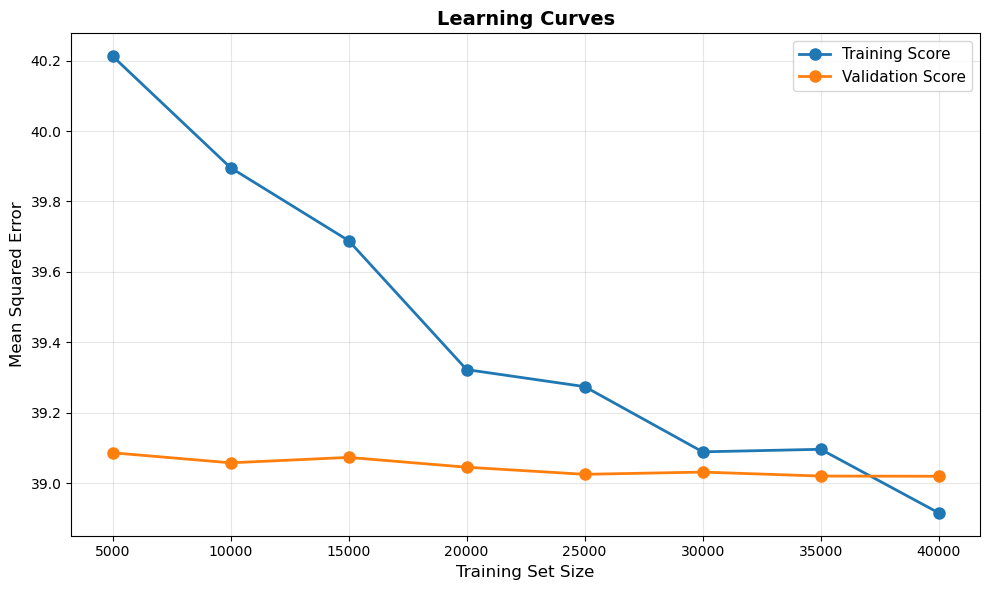


✅ Đã vẽ biểu đồ Learning Curves

=== KẾT QUẢ CUỐI CÙNG ===
Training MSE (full size): 38.92
Validation MSE (full size): 39.02
Gap (Validation - Training): 0.10


In [33]:
# Vẽ biểu đồ Learning Curves
print("=== VẼ BIỂU ĐỒ LEARNING CURVES ===")

# Chuẩn bị dữ liệu
label = "diabetes_risk_score"
features = [col for col in df.columns if col != label]

print(f"Features: {features}")
print(f"Label: {label}")

# Tạo DataFrame cho ML
df_ml = df.select(*(features + [label]))

# Tạo pipeline
assembler = VectorAssembler(inputCols=features, outputCol="features_raw")
scaler = StandardScaler(inputCol="features_raw", outputCol="features", withStd=True, withMean=False)
lr = SparkLinearRegression(featuresCol="features", labelCol=label, predictionCol="prediction")

pipeline = Pipeline(stages=[assembler, scaler, lr])

# Chia train/validation
train_data, val_data = df_ml.randomSplit([0.8, 0.2], seed=42)

# Các kích thước tập training để thử nghiệm
training_sizes = [5000, 10000, 15000, 20000, 25000, 30000, 35000, 40000]
train_scores = []
val_scores = []

evaluator = RegressionEvaluator(labelCol=label, predictionCol="prediction", metricName="mse")

print("\nĐang tính toán Learning Curves...")
total_train = train_data.count()
print(f"Tổng số dòng training: {total_train}")

for size in training_sizes:
    if size > total_train:
        print(f"⚠️ Bỏ qua size {size} vì lớn hơn tổng số dòng training")
        continue
    
    # Lấy mẫu subset của training data
    fraction = size / total_train
    train_subset = train_data.sample(withReplacement=False, fraction=fraction, seed=42)
    actual_size = train_subset.count()
    
    print(f"\nTraining với {actual_size} dòng...")
    
    # Train model
    model = pipeline.fit(train_subset)
    
    # Đánh giá trên training subset
    train_pred = model.transform(train_subset)
    train_mse = evaluator.evaluate(train_pred)
    train_scores.append(train_mse)
    
    # Đánh giá trên validation set
    val_pred = model.transform(val_data)
    val_mse = evaluator.evaluate(val_pred)
    val_scores.append(val_mse)
    
    print(f"  Training MSE: {train_mse:.2f}")
    print(f"  Validation MSE: {val_mse:.2f}")

# Điều chỉnh training_sizes nếu bỏ qua một số giá trị
actual_sizes = training_sizes[:len(train_scores)]

# Vẽ biểu đồ Learning Curves
plt.figure(figsize=(10, 6))
plt.plot(actual_sizes, train_scores, 'o-', color='#1f77b4', linewidth=2, markersize=8, label='Training Score')
plt.plot(actual_sizes, val_scores, 'o-', color='#ff7f0e', linewidth=2, markersize=8, label='Validation Score')

plt.xlabel('Training Set Size', fontsize=12)
plt.ylabel('Mean Squared Error', fontsize=12)
plt.title('Learning Curves', fontsize=14, fontweight='bold')
plt.legend(loc='best', fontsize=11)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("\n✅ Đã vẽ biểu đồ Learning Curves")

# In kết quả cuối cùng
print(f"\n=== KẾT QUẢ CUỐI CÙNG ===")
print(f"Training MSE (full size): {train_scores[-1]:.2f}")
print(f"Validation MSE (full size): {val_scores[-1]:.2f}")
print(f"Gap (Validation - Training): {val_scores[-1] - train_scores[-1]:.2f}")

=== VẼ MA TRẬN TƯƠNG QUAN (CORRELATION MATRIX HEATMAP) ===
Các cột số: ['age', 'physical_activity_minutes_per_week', 'diet_score', 'bmi', 'systolic_bp', 'hdl_cholesterol', 'ldl_cholesterol', 'triglycerides', 'glucose_fasting', 'hba1c', 'diabetes_risk_score']
Số cột: 11

=== MA TRẬN TƯƠNG QUAN ===
                                         age  \
age                                 1.000000   
physical_activity_minutes_per_week  0.003352   
diet_score                         -0.003326   
bmi                                 0.092643   
systolic_bp                         0.547696   
hdl_cholesterol                    -0.016358   
ldl_cholesterol                     0.281275   
triglycerides                       0.039449   
glucose_fasting                     0.231533   
hba1c                               0.159447   
diabetes_risk_score                 0.495924   

                                    physical_activity_minutes_per_week  \
age                                                

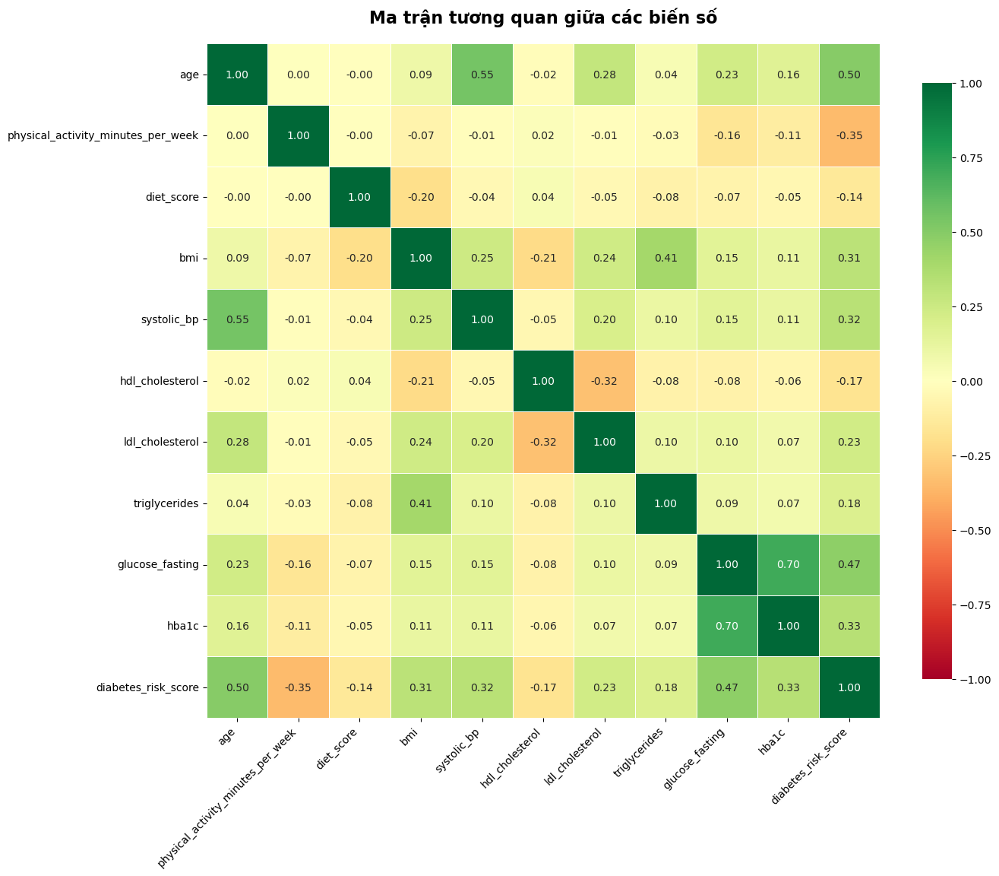


✅ Đã vẽ ma trận tương quan

=== CÁC CẶP TƯƠNG QUAN CAO (|r| > 0.7) ===
      Feature 1 Feature 2  Correlation
glucose_fasting     hba1c     0.700352

=== TƯƠNG QUAN VỚI DIABETES_RISK_SCORE ===
diabetes_risk_score                   1.000000
age                                   0.495924
glucose_fasting                       0.469938
hba1c                                 0.329947
systolic_bp                           0.323591
bmi                                   0.313813
ldl_cholesterol                       0.227772
triglycerides                         0.180484
diet_score                           -0.144891
hdl_cholesterol                      -0.174459
physical_activity_minutes_per_week   -0.348121
Name: diabetes_risk_score, dtype: float64


In [34]:
# Vẽ ma trận tương quan (Correlation Matrix Heatmap)
print("=== VẼ MA TRẬN TƯƠNG QUAN (CORRELATION MATRIX HEATMAP) ===")

# Lấy dữ liệu
df_corr = df.toPandas()

# Lấy tất cả các cột số
numeric_cols_corr = [col for col in df_corr.columns]

print(f"Các cột số: {numeric_cols_corr}")
print(f"Số cột: {len(numeric_cols_corr)}")

# Tính ma trận tương quan
correlation_matrix = df_corr[numeric_cols_corr].corr()

print("\n=== MA TRẬN TƯƠNG QUAN ===")
print(correlation_matrix)

# Vẽ heatmap
plt.figure(figsize=(14, 12))
sns.heatmap(correlation_matrix, 
            annot=True,  # Hiển thị giá trị số
            fmt='.2f',   # Định dạng 2 chữ số thập phân
            cmap='RdYlGn',  # Màu: đỏ (âm) -> vàng (0) -> xanh (dương)
            center=0,    # Tâm tại 0
            square=True, # Ô vuông
            linewidths=0.5,  # Đường viền
            cbar_kws={"shrink": 0.8},  # Thanh màu
            vmin=-1, vmax=1)  # Giới hạn từ -1 đến 1

plt.title('Ma trận tương quan giữa các biến số', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('')
plt.ylabel('')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

print("\n✅ Đã vẽ ma trận tương quan")

# Tìm các cặp tương quan cao (> 0.7 hoặc < -0.7)
print("\n=== CÁC CẶP TƯƠNG QUAN CAO (|r| > 0.7) ===")
high_corr_pairs = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        corr_value = correlation_matrix.iloc[i, j]
        if abs(corr_value) > 0.7:
            high_corr_pairs.append({
                'Feature 1': correlation_matrix.columns[i],
                'Feature 2': correlation_matrix.columns[j],
                'Correlation': corr_value
            })

if high_corr_pairs:
    high_corr_df = pd.DataFrame(high_corr_pairs).sort_values('Correlation', ascending=False)
    print(high_corr_df.to_string(index=False))
else:
    print("Không có cặp nào có tương quan > 0.7")

# Tương quan với diabetes_risk_score
if 'diabetes_risk_score' in correlation_matrix.columns:
    print("\n=== TƯƠNG QUAN VỚI DIABETES_RISK_SCORE ===")
    target_corr = correlation_matrix['diabetes_risk_score'].sort_values(ascending=False)
    print(target_corr)